In [3]:
from random import random
c = [random() for i in range(10000)]
%timeit min(c)

178 µs ± 6.05 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [6]:
import numpy as np
c = np.array(c)

%timeit c.min()

5.02 µs ± 51.8 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


## Snippet usato per piazzare immagini direttamente in una presentazione
Vanno migliorate varie cose:
1) ogni slide e' una immagine dimensione 2000 x 2000 e fanculo
2) piazzarci un nome e un bel titolo

In [63]:
## Script for importing images directly into a ppt presentation
import pptx.util
import glob
import imageio
import matplotlib

OUTPUT_TAG = "AG_LG07_1_IVsVg_mol_methoxy_methoxy_depo_2"
dir = r'I:\2021\AG_LG07_1\mol methoxy_depo_2\AG_LG07_1_IVsVg\20210201\figure_plot_SD_and_GT_100_500mV_100mVstep'
# new
prs = pptx.Presentation()
# open
# prs_exists = pptx.Presentation("some_presentation.pptx")

# default slide width
#prs.slide_width = 9144000
# slide height @ 4:3
#prs.slide_height = 6858000
# slide height @ 16:9
prs.slide_height = 5143500

# title slide
slide = prs.slides.add_slide(prs.slide_layouts[0])
# blank slide
#slide = prs.slides.add_slide(prs.slide_layouts[6])

# set title
title = slide.shapes.title
title.text = OUTPUT_TAG

pic_left  = int(prs.slide_width * 0.15)
pic_top   = int(prs.slide_height * 0.1)
pic_width = int(prs.slide_width * 0.7)


for i in os.listdir(dir):
    if i.endswith('.png'):
        os.chdir(dir)
        print(i)
        slide = prs.slides.add_slide(prs.slide_layouts[6])
        tb = slide.shapes.add_textbox(0, 0, prs.slide_width, pic_top / 2)
        p = tb.text_frame.add_paragraph()
        p.text = i
        p.font.size = pptx.util.Pt(14)

        img = imageio.imread(i, pilmode="RGB")
        pic_height = int(pic_width * img.shape[0] / img.shape[1])
        #pic   = slide.shapes.add_picture(g, pic_left, pic_top)
        pic   = slide.shapes.add_picture(i, pic_left, pic_top, pic_width, pic_height)

    prs.save("%s.pptx" % OUTPUT_TAG)

u28_0.png
u29_1.png
u30_2.png
u31_3.png
u32_4.png
u33_5.png
u34_6.png
u35_7.png
u36_8.png
u37_9.png
u38_10.png
v22_11.png
v23_12.png
v24_13.png
v25_14.png
v26_15.png
v27_16.png
v28_17.png
v29_18.png
v30_19.png
v31_20.png
v32_21.png
v33_22.png
v34_23.png
v35_24.png
v36_25.png
v37_26.png
v38_27.png
w22_28.png
w23_29.png
w24_30.png
w25_31.png
w26_32.png
w27_33.png
w28_34.png
w29_35.png
w30_36.png
w31_37.png
w32_38.png
w33_39.png
w34_40.png
w35_41.png
w36_42.png
w37_43.png
w38_44.png


In [1]:
import os
import numpy as numpy
import matplotlib.pyplot as plt
import string
from imports.qtlab_data import *
from imports.dataclass import *
from imports.physics_models import *
from matplotlib.colors import to_rgba

folder_IVg = "mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest"
chipPiece = "AG_LG06_5_GNR_anthracene"
match = "{}".format(folder_IVg)
pattern = ".*?(?P<folder>{}).*?\d+_(?P<exp>[a-zA-Z0-9_]+)_(?P<type>[a-zA-Z0-9\-_]+?)_(?P<device>[a-zA-Z]+[0-9]+)\.(?:dat|csv|txt)".format(
    match
)
os.chdir(r"G:\2021\AG_LG06_5_GNR_anthracene")
dset = QTLab_Dataset.find(pattern=pattern)
dset = dset[np.argsort(dset["timestamp"])[::-1]]
dset[dset["type"] == "IVg"]
data = dset.load(QTLab_Data)

> Updating info timestamp in dataset.
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVsVg/20210115/225714_AG_LG06_5_GNR_methoxy_IVsVg_g35.dat
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVg/20210115/225608_AG_LG06_5_GNR_methoxy_IVg_g35.dat
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVg/20210115/225503_AG_LG06_5_GNR_methoxy_IVg_g35.dat
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVg/20210115/225402_AG_LG06_5_GNR_methoxy_IVg_g35.dat
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVg/20210115/225256_AG_LG06_5_GNR_methoxy_IVg_g35.dat
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVg/20210115/225156_AG_LG06_5_GNR_methoxy_IVg_g35.dat
>>> Loading ./mol gnr_methoxy_dil1to100_tol_gs_sd_goodev_2ndTest/AG_LG06_5_GNR_methoxy_IVg/20210115/225050_AG_LG

In [23]:
gs = data.gate_trace

Vg:
[-4. -4. -4. ...  4.  4.  4.]



## Plot GT after have been loaded with dset.load(QTLab_Dataset)

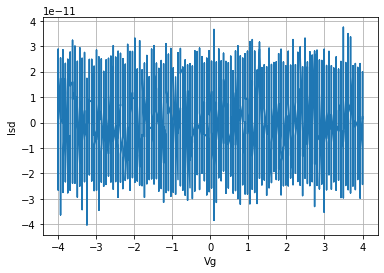

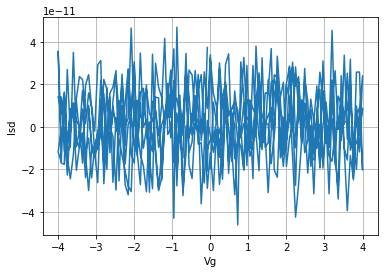

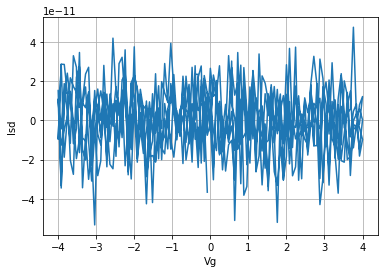

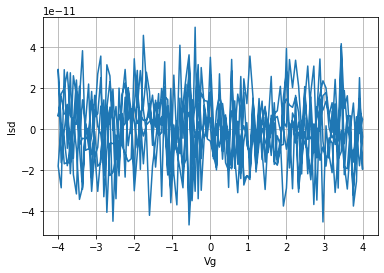

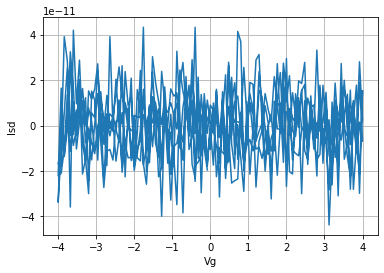

...

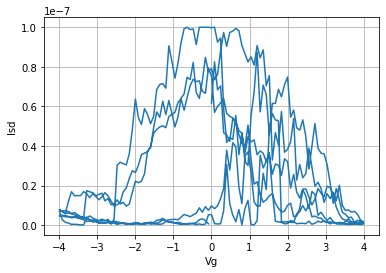

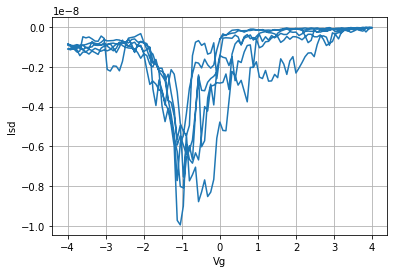

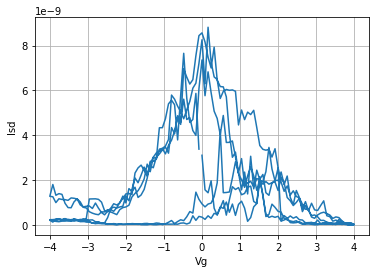

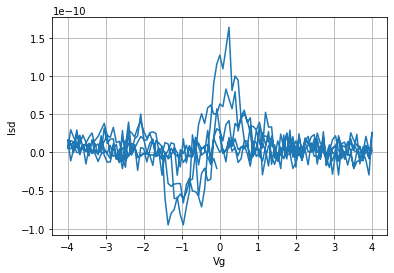

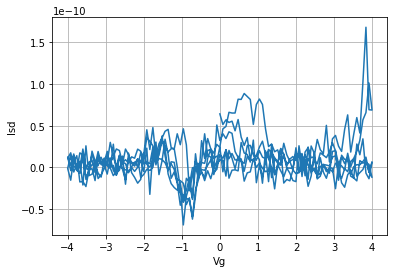

In [24]:

for i in range(len(data)):
    os.chdir(r'G:\2021\AG_LG06_5_GNR_anthracene\Figures')
    fig, ax = plt.subplots()
    ax.plot(data[i]['Vg'], data[i]['Isd'])
    ax.set(xlabel='Vg', ylabel='Isd')
    ax.grid()
    fig.savefig(f"Figure_{i}.png")
    plt.show()